In [1]:
import os, sys, json, datetime, copy, uuid, requests
import logging
from flask import Flask, request, jsonify 
from flask_cors import CORS
# from pymongo import MongoClient
from io import BytesIO
import skimage, PIL
import numpy as np
from os import listdir

In [2]:
from analyzer_no_google import ResNet18, detect_text, image_from_url, detect_lang, doc2vec
from search import ImageSearch, DocSearch

In [3]:
def image_from_url(image_url):
    resp = requests.get(image_url)
    image_bytes = resp.content
    image = PIL.Image.open(BytesIO(image_bytes))
    image_array = np.array(image)
    return {'image' : image, 'image_array' : image_array, 'image_bytes' : image_bytes}

In [4]:
image_url = 'https://i.ytimg.com/vi/I1Hbht4iNQg/maxresdefault.jpg'
img = image_from_url(image_url)

In [9]:
img.keys()

dict_keys(['image', 'image_array', 'image_bytes'])

In [11]:
imagesearch = ImageSearch()
docsearch = DocSearch()
resnet18 = ResNet18()

KeyError: 'MONGO_URL'

### setting up mongo

In [12]:
from pymongo import MongoClient

In [19]:
# connect to a host for the db
# why do we need a host? where is the file saved?
client = MongoClient()
# client = MongoClient('localhost', 27017)

In [21]:
client.test_database

Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'test_database')

In [28]:
client.start_session()

ServerSelectionTimeoutError: localhost:27017: [Errno 111] Connection refused

In [22]:
# connect to the client
# 'db' is the name of the newly created database, or existing one
db = client['db']

In [17]:
# create fake data
article = {"author": "Derrick Mwiti",
        "about": "Introduction to MongoDB and Python",
        "tags":
            ["mongodb", "python", "pymongo"]}

In [18]:
# what is db.articles?
articles = db.articles
result = articles.insert_one(article)

ServerSelectionTimeoutError: localhost:27017: [Errno 111] Connection refused

### setting up json store

In [29]:
import json

In [44]:
data= {'01': {'info': 'dummy entry', 'doc_id': 1, 'vec': [0,0]}, '02': {'info': 'dummy entry', 'doc_id': 1, 'vec': [0,0]}}

In [31]:
db_filename = 'json_db.json'

In [45]:
with open(db_filename, 'w') as f:
    json.dump(data, f)

In [46]:
with open(db_filename, 'r') as f:
    db = json.load(f)

In [47]:
db.__len__()

2

### reading txt and img files

In [11]:
from os import listdir

In [19]:
import sqlite3
import langdetect
import json
import numpy as np

In [5]:
# doc2vec = []
from analyzer_no_google import doc2vec

In [63]:
def doc2vec(text, db_filename='word2vec/word2vec.db'):
    """
    avg the word vectors for each word in the doc,
    ignore the words not found in the db

    Arguments:
        text {str} -- string of text

    Returns:
        [list] -- avg of all word vectors
    """

    # ~TODO: preprocessing of text
    # how resilient are the embeddings to tokenization, removing special characters, apostrophes

    conn = sqlite3.connect(db_filename)
    cur = conn.cursor()

    # get lang_id
    lang = detect_lang(text)
    if lang is None:
        return None

    resp = cur.execute(
        "select * from lang_ids where lang='" + lang + "'").fetchone()
    if resp is None:
        return None
    lang_id = resp[0]

    # query wordvecs for each word in text for that lang_id
    words = text.split(' ')
    query = f"SELECT * from wordvecs where lang_id={lang_id} and word in " +\
        '('+','.join(['\''+i.replace("'", "")+'\'' for i in words])+')'
    print(query)

    resp = cur.execute(query)
    if resp is None:
        return None

    vecs = []
    print(resp.fetchall())
    for word, _, vec in resp.fetchall():
        vec = json.loads(vec)
        print('hi', vec)
        vec = np.array(vec)
        vecs.append(vec)
    
    mean_vec = np.mean(vecs, axis=0)
    return mean_vec
    #     return mean_vec.tolist()

In [21]:
def detect_lang(text):
    """detect if str lang is supported

    Arguments:
        text {str} -- text

    Returns:
        [str] -- lang: ['en', 'hi', 'gu']
    """
    supported = ['en', 'hi', 'gu']
    lang = langdetect.detect(text)
    if lang not in supported:
        return None
    else:
        return lang

In [36]:
folder = './tests/texts/'
files = listdir(folder)
db_filename = 'word2vec/word2vec.db'

In [44]:
files[-1]

'953dee666d9af6f310beb83863bb841221c06336.txt'

In [95]:
for file in files[:1]:
    with open(folder + file, 'r') as d:
        text = d.read()
        print(text)
        
        vec = doc2vec(text, db_filename)
        print(vec)

*जो भी गलत मैसेज डालेगा वह जेल जाएगा आज से WhatsApp अपडेट हो चुका है हर WhatsApp Group परिवार पुलिस कि निगरानी में है कोई भी पोस्ट डाले बिल्कुल सोच समझ कर अगर आपका मैसेज रेड हो गया तो आपको जेल जाना तय है इसलिए गलत मैसेज कोई भी व्यक्ति पोस्ट नहीं करेंगे*
hi
SELECT * from wordvecs where lang_id=1 and word in ('*जो','भी','गलत','मैसेज','डालेगा','वह','जेल','जाएगा','आज','से','WhatsApp','अपडेट','हो','चुका','है','हर','WhatsApp','Group','परिवार','पुलिस','कि','निगरानी','में','है','कोई','भी','पोस्ट','डाले','बिल्कुल','सोच','समझ','कर','अगर','आपका','मैसेज','रेड','हो','गया','तो','आपको','जेल','जाना','तय','है','इसलिए','गलत','मैसेज','कोई','भी','व्यक्ति','पोस्ट','नहीं','करेंगे*')
[('अगर', 1, '[-0.11451, 0.075723, -0.29234, 0.044769, 0.21164, -0.026356, -0.21655, -0.23897, 0.12208, 0.07804, 0.23001, -0.080431, 0.031212, -0.34571, -0.1299, -0.076013, 0.094663, -0.033388, 0.010416, -0.14058, -0.27424, 0.28801, 0.14064, 0.098029, -0.21668, 0.18136, -0.12103, 0.069607, 0.11202, -0.08346, 0.0014898, -0.10762, 

/home/kjoshi/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/kjoshi/.local/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [75]:
d.readlines

<function TextIOWrapper.readlines(hint=-1, /)>

### langdetect

In [49]:
import langdetect

In [60]:
langdetect.detect('i')

'af'

In [53]:
langdetect.detect(' इंग्लिश में टाइप करे स्पेस दबाये यह हिन्दी में परिवर्तित हो जाएगा')

'hi'

In [55]:
langdetect.detect_langs(' इंग्लिश में टाइप करे स्पेस दबाये यह हिन्दी में परिवर्तित हो जाएगा')

[hi:0.999998522802617]

In [59]:
langdetect.detect_langs('i really absolutely adore pie')

[en:0.857141676676714, it:0.14285687966164518]

### image_bytes

In [61]:
import requests

In [62]:
image_url = 'https://proxy.duckduckgo.com/iu/?u=https%3A%2F%2Fres.cloudinary.com%2Fdk-find-out%2Fimage%2Fupload%2Fq_80%2Cw_1920%2Cf_auto%2FBabylon_MA_00819512_gjeg8c.jpg&f=1&nofb=1'
resp = requests.get(image_url)

In [64]:
image_bytes = resp.content

In [65]:
image_bytes

b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00\x96\x00\x96\x00\x00\xff\xdb\x00C\x00\x06\x04\x05\x06\x05\x04\x06\x06\x05\x06\x07\x07\x06\x08\n\x10\n\n\t\t\n\x14\x0e\x0f\x0c\x10\x17\x14\x18\x18\x17\x14\x16\x16\x1a\x1d%\x1f\x1a\x1b#\x1c\x16\x16 , #&\')*)\x19\x1f-0-(0%()(\xff\xdb\x00C\x01\x07\x07\x07\n\x08\n\x13\n\n\x13(\x1a\x16\x1a((((((((((((((((((((((((((((((((((((((((((((((((((\xff\xc0\x00\x11\x08\x04X\x07\x80\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1c\x00\x00\x01\x05\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x03\x04\x06\x07\x02\x01\x08\xff\xc4\x00Y\x10\x00\x02\x01\x02\x05\x01\x05\x05\x06\x05\x01\x06\x04\x01\x01\x19\x01\x02\x03\x04\x11\x00\x05\x12!1A\x06\x13"Qa\x142q\x81\x91\x07#\xa1\xb1\xc1\xf0\x15BR\xd1\xe1b\x16$3r\x82\xf1C\x92\xa2\xb2%S\xc2\xd2\x174cs&5\xe2\x086DTt\x83\x93\'Ed\xa3\x85\xb3\xc3\xd3\xf2\xff\xc4\x00\x1a\x01\x00\x03\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x03\x01\x04\x05\x06\xff\xc4\x00B\x11\x00\x02\x02\x01\x03\x02\

### connect to word2vec db

In [65]:
import sqlite3

In [88]:
db = 'word2vec/word2vec.db'
conn = sqlite3.connect(db)

In [89]:
cur = conn.cursor()

In [90]:
query = "SELECT * from lang_ids"

In [91]:
cur.execute(query).fetchall()

[(0, 'en'), (1, 'hi'), (2, 'gu')]

In [92]:
query = "SELECT name FROM sqlite_master WHERE type='table';"
print(cur.execute(query).fetchall())

[('lang_ids',), ('wordvecs',)]


In [94]:
query = 'SELECT word from wordvecs where lang_id=0 LIMIT 100'
cur.execute(query).fetchall()

[('के',),
 ('</s>',),
 ('में',),
 ('है',),
 ('की',),
 ('और',),
 ('से',),
 ('का',),
 ('को',),
 ('एक',),
 ('हैं',),
 ('पर',),
 ('किया',),
 ('लिए',),
 ('भी',),
 ('ने',),
 ('यह',),
 ('कि',),
 ('इस',),
 ('था',),
 ('गया',),
 ('जो',),
 ('जाता',),
 ('रूप',),
 ('ही',),
 ('हो',),
 ('कर',),
 ('करने',),
 ('या',),
 ('नहीं',),
 ('-',),
 ('द्वारा',),
 ('तथा',),
 ('साथ',),
 ('भारत',),
 ('होता',),
 ('बाद',),
 ('अपने',),
 ('थे',),
 ('तक',),
 ('दिया',),
 ('तो',),
 ('कुछ',),
 ('जा',),
 ('थी',),
 ('वह',),
 ('राज्य',),
 ('एवं',),
 ('हुआ',),
 ('करते',),
 ('हुए',),
 ('किसी',),
 ('इसके',),
 ('वर्ष',),
 ('सकता',),
 ('वे',),
 ('समय',),
 ('होती',),
 ('नाम',),
 ('अधिक',),
 ('कई',),
 ('अन्य',),
 ('वाले',),
 ('होने',),
 ('प्रकार',),
 ('पूर्व',),
 ('कारण',),
 ('जैसे',),
 ('करता',),
 ('क्षेत्र',),
 ('जाती',),
 ('उनके',),
 ('जब',),
 ('अपनी',),
 ('पहले',),
 ('सबसे',),
 ('लेकिन',),
 ('बहुत',),
 ('गए',),
 ('होते',),
 ('कोई',),
 ('उन्होंने',),
 ('आदि',),
 ('दो',),
 ('कम',),
 ('जन्म',),
 ('जिले',),
 ('उसके',),
 ('इन',),
 ('

### testing image functions

In [24]:
from PIL import Image
import skimage.io
import numpy as np

In [19]:
from analyzer_no_google import ResNet18

In [25]:
model = ResNet18()
url = "https://firebasestorage.googleapis.com/v0/b/crowdsourcesocialposts.appspot.com/o/image-posts%2F06c1eaa0-feea-42e5-8eee-b3ab3b099831?alt=media&token=cf1b9b4f-fa1f-48e4-8d64-82476cfeec1a"
img = Image.fromarray(skimage.io.imread(url))
fnames = ['01545ee202e12f8435d4a0997f4072c370de0897.jpg',
          '01545ee202e12f8435d4a0997f4072c370de0897_1.jpg',
          '01545ee202e12f8435d4a0997f4072c370de0897_2.jpg',
          '01545ee202e12f8435d4a0997f4072c370de0897_3.jpg',
          'efe1cf7044079d2dac7f8f1294f71f9244d42f80.jpg']

In [26]:
imgs = [Image.open('tests/images/'+i) for i in fnames]
features = [model.extract_feature(img) for img in imgs]

for f in features[1:]:
    print(np.linalg.norm(f - features[0]))

3.365
10.484
11.81
28.25


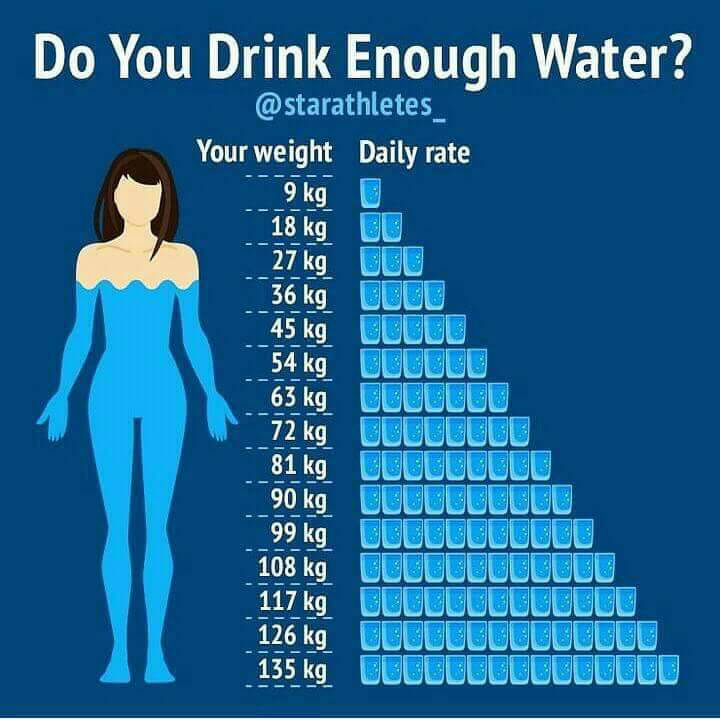

In [210]:
img

In [211]:
BytesIO(img)

TypeError: a bytes-like object is required, not 'Image'

In [228]:
img.tobytes()

b'\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x

In [43]:
isinstance(img, Image.Image)

True

In [46]:
assert(type(img) == Image.Image)

### sqlite3 db wrapper

In [57]:
import sqlite3

In [141]:
class sqlDatabase:
    """
    Database wrapper/layer to make rest of code db-agnostic
    
    TODO: some of the methods are quite empty, remove and use native methods
    """

    # # if table already exists, exit function
    # # https://stackoverflow.com/questions/6190776/what-is-the-best-way-to-exit-a-function-which-has-no-return-value-in-python-be
    # if not self.exists:
    #     self.__exit__()

    def setup(self):
        import sqlite3
        import numpy as np
        from io import BytesIO

        # https://stackoverflow.com/questions/18621513/python-insert-numpy-array-into-sqlite3-database
        def adapt_array(arr):
            """
            http://stackoverflow.com/a/31312102/190597 (SoulNibbler)
            """
            out = BytesIO()
            np.save(out, arr)
            out.seek(0)
            return sqlite3.Binary(out.read())

        def convert_array(text):
            out = BytesIO(text)
            out.seek(0)
            return np.load(out)
        
        def im2bin(img):
            stream = io.BytesIO()
            img.save(stream, format="JPEG")
            img_bytes = stream.get_value()

        # Converts np.array to TEXT when inserting
        sqlite3.register_adapter(np.ndarray, adapt_array)

        # Converts TEXT to np.array when selecting
        sqlite3.register_converter("array", convert_array)

    def __init__(self, filename):    
        self.setup()
        
        self.db = None
        self._conn = sqlite3.connect(filename, detect_types=sqlite3.PARSE_DECLTYPES)
        self._cursor = self._conn.cursor()
        self.exists = self._cursor.fetchone()

    def __enter__(self):
        return self

    def __exit__(self, exc_type, exc_val, exc_tb):
        self.commit()
        self.connection.close()

    def get_tablenames(self):
        return self.query("SELECT name FROM sqlite_master WHERE type='table'")

    def get_table_schema(self, table_name):
        return self.query(
            'SELECT sql FROM sqlite_master WHERE type="table" and name="' + table_name + '"')

    @property
    def connection(self):
        return self._conn

    @property
    def cursor(self):
        return self._cursor

    def commit(self):
        self.connection.commit()

    def execute(self, sql, params=None):
        self.cursor.execute(sql, params or ())

    def executemany(self, sql, params=None):
        self.cursor.executemany(sql, params or ())
        
    def fetchall(self):
        return self.cursor.fetchall()

    def fetchone(self):
        return self.cursor.fetchone()

    def query(self, sql, params=None):
        self.cursor.execute(sql, params or ())
        return self.fetchall()

    def create_table(self, table_name, table_tuple):
        # table_name = lang_ids, table_tuple = (lang_id int, lang text)
        # this is a stupid method: remove
        # TODO: check if table exists
        self.cur.execute("CREATE TABLE " + table_name + " " + table_tuple)

    def insert_values(self, table_name, values):
        # this is a stupid method: remove
        query = 'insert into' + table_name + 'values' + values

    def get_db(self):
        # mongo_url = os.environ['MONGO_URL']
        # cli = MongoClient(mongo_url)
        # db = cli.documents
        return None

In [275]:
!rm docs_sqlite_db.db
db = sqlDatabase(filename='docs_sqlite_db.db')

In [276]:
# https://www.tutorialspoint.com/sqlite/sqlite_data_types.htm
insert_table_query = 'CREATE TABLE documents (doc_id integer primary key, has_image int, has_text int, date_added text, date_updated text, tags text, textdata text, imagedata blob, imagemetadata text, lang text, vec array)'
db.execute(insert_table_query)

In [123]:
query = "SELECT name FROM sqlite_master WHERE type='table';"
db.execute(query)
db.fetchall()

[('documents',)]

In [124]:
db.get_tablenames()

[('documents',)]

In [233]:
db.get_table_schema('documents')

[('CREATE TABLE documents (doc_id integer primary key, has_image int, has_text int, date_added text, date_updated text, tags text, textdata text, imagedata blob, lang text, vec array)',)]

In [58]:
from datetime import date

In [170]:
data = {'doc_id': 1, 'has_image': 0, 'has_text': 1, 'date_added': date.today(), 'date_updated': date.today(), 
        'tags': '["english", "pie"]', 'text': 'i like pie', 'lang': 'en', 'vec': np.ones(512,)}

In [277]:
data_many = [(0, 1, date.today(), date.today(), str(['english', 'fun']), 'i like pie', 
              img.tobytes(), str({'mode': img.mode, 'size': img.size}), 'en', np.ones(512,)), 
             (0, 1, date.today(), date.today(), str(['english', 'fun']), 'i like pie', 
              img.tobytes(), str({'mode': img.mode, 'size': img.size}), 'en', np.ones(512,))]

In [171]:
table_name = 'documents'
insert_query = 'INSERT into ' + table_name + ' values (?,?,?,?,?,?,?,?,?)'

In [129]:
data.values

<function dict.values>

In [172]:
db.execute(insert_query, list(data.values()))

In [198]:
eval(db.query('SELECT tags from documents')[0][0])

['english', 'pie']

In [150]:
db.query('SELECT vec from documents LIMIT 0')

[]

In [192]:
str(list(data.keys())[1:]).strip('[]').strip("''")

"has_image', 'has_text', 'date_added', 'date_updated', 'tags', 'text', 'lang', 'vec"

In [278]:
db._cursor.executemany('INSERT into documents(has_image, has_text, date_added, date_updated, tags, textdata, imagedata, imagemetadata, lang, vec) values(?,?,?,?,?,?,?,?,?,?)', data_many)

In [194]:
data_many[0][4]

['english', 'fun']

In [280]:
a = db.query('SELECT imagemetadata from documents')

In [281]:
a

[("{'mode': 'RGB', 'size': (720, 720)}",),
 ("{'mode': 'RGB', 'size': (720, 720)}",)]

In [284]:
eval(a[0][0])

{'mode': 'RGB', 'size': (720, 720)}

In [253]:
a[0][0]

b'\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x04E{\x

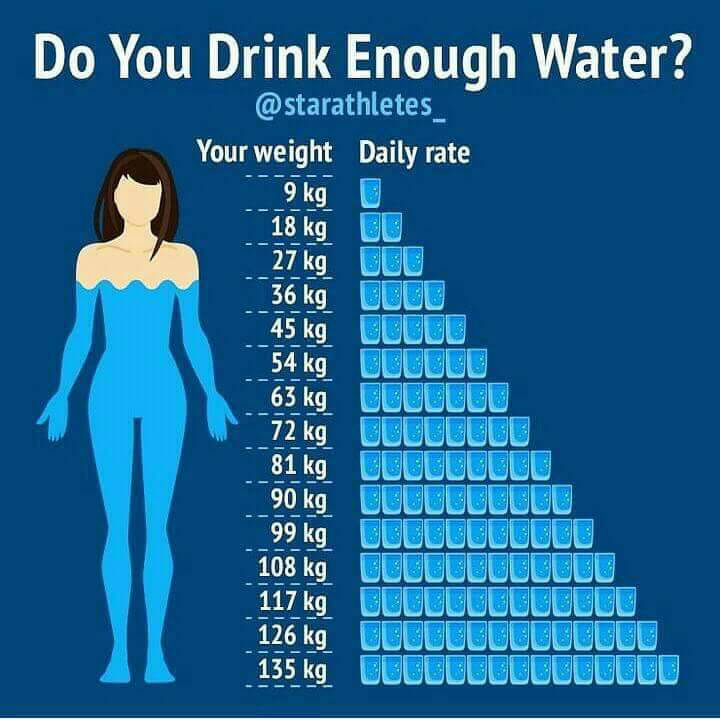

In [258]:
Image.frombytes("RGB", (720,720), a[0][0])

In [218]:
def im2bin(img):
    stream = BytesIO()
    img.save(stream, format="JPEG")
    img_bytes = stream.getvalue()
    
    return img_bytes

In [219]:
im2bin(img)

b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x08\x06\x06\x07\x06\x05\x08\x07\x07\x07\t\t\x08\n\x0c\x14\r\x0c\x0b\x0b\x0c\x19\x12\x13\x0f\x14\x1d\x1a\x1f\x1e\x1d\x1a\x1c\x1c $.\' ",#\x1c\x1c(7),01444\x1f\'9=82<.342\xff\xdb\x00C\x01\t\t\t\x0c\x0b\x0c\x18\r\r\x182!\x1c!22222222222222222222222222222222222222222222222222\xff\xc0\x00\x11\x08\x02\xd0\x02\xd0\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd2\xd3\

In [220]:
img.

<bound method Image.frombytes of <PIL.Image.Image image mode=RGB size=720x720 at 0x7F8CE0F04908>>

In [10]:
from os import listdir

In [8]:
texts_folder = listdir('tests/texts/')
images_folder = listdir('tests/images/')

In [288]:
texts_folder

['19b727d3dea306a834906c785351127957257010.txt',
 '202000a8c071076c2aedc2a86fcef8f93d06b8e2.txt',
 '87ea346f5f3b48bc222fac4c0600eb8e8bd9872d.txt',
 '90e58ee967725a4c41ff6eb261b5aed41e25d8e8.txt',
 '953dee666d9af6f310beb83863bb841221c06336.txt']

In [11]:
for file in texts_folder:
    with open('tests/texts/' + file, 'r') as f:
        textdata = f.read()
        print(textdata)


[8/10, 3:48 PM] Mumma: https://youtu.be/ZqKgpf1ytYw
[8/10, 3:49 PM] Mumma: ☝ very important. Must watch
Gurugram World's Most Polluted City, 6 Others In India In Top 10: Study : https://www.ndtv.com/india-news/gurgaon-is-the-worlds-most-polluted-city-says-new-study-2002741
15 SHOCKING FACTS ABOUT VITAMIN D.
Must must read n forward to your all near & dear ones plus well-wishers

Vitamin D is perhaps the single most *underrated nutrient* in the world of nutrition. 

That's probably because it's free....
Your body makes it when sunlight touches your skin !!

Drug companies can't sell you sunlight, so there's no promotion of its health benefits..

The truth is, most people don't know the real story on "vitamin D and health."

 So here's an overview taken from an interview between Mike Adams and *Dr.Michael Holick*.

◆ 1. Vitamin D is *produced by your skin* in response to exposure to ultraviolet radiation *from natural sunlight*. 

◆ 2. The healing rays of natural sunlight (that generate

### test db.py

In [5]:
from db import create_sql_db, sqlDatabase
from datetime import date
from os import listdir

In [10]:
!rm docs_sqlite_db.db

In [11]:
from analyzer_no_google import doc2vec
import langdetect

db = sqlDatabase(filename='docs_sqlite_db.db')

# https://www.tutorialspoint.com/sqlite/sqlite_data_types.htm
insert_table_query = 'CREATE TABLE documents (doc_id integer primary key, has_image int, has_text int, date_added text, date_updated text, tags text, textdata text, lang text, vec array, imagedata blob, imagemetadata text, imagevec array)'
db.execute(insert_table_query)

texts_folder = listdir('tests/texts/')
images_folder = listdir('tests/images/')

# defaults
has_text = 1
has_image = 0
date_added = date.today()
date_updated = date.today()
tags = None
imagedata = None
imagemetadata = None

In [12]:
def detect_lang(text):
    supported = ['en','hi','gu']
    lang = langdetect.detect(text)
    if lang not in supported:
        return None
    else:
        return lang

In [10]:
for file in texts_folder:
    with open('tests/texts/' + file, 'r') as f:
        textdata = f.read()
        if len(textdata) == 0:
            continue
        vec, lang = doc2vec(textdata, 'word2vec/word2vec.db')
        
    data = (has_text, has_image, date_added, date_updated,
            tags, textdata, imagedata, imagemetadata, lang, vec)
        
    db.execute('INSERT into documents(has_image, has_text, date_added, date_updated, tags, textdata, imagedata, imagemetadata, lang, vec) values(?,?,?,?,?,?,?,?,?,?)', data)

SELECT * from wordvecs where lang_id=0 and word in ('[8/10,','3:48','PM]','Mumma:','https://youtu.be/ZqKgpf1ytYw
[8/10,','3:49','PM]','Mumma:','☝','very','important.','Must','watch')
SELECT * from wordvecs where lang_id=0 and word in ('Gurugram','Worlds','Most','Polluted','City,','6','Others','In','India','In','Top','10:','Study',':','https://www.ndtv.com/india-news/gurgaon-is-the-worlds-most-polluted-city-says-new-study-2002741')
SELECT * from wordvecs where lang_id=0 and word in ('15','SHOCKING','FACTS','ABOUT','VITAMIN','D.
Must','must','read','n','forward','to','your','all','near','&','dear','ones','plus','well-wishers

Vitamin','D','is','perhaps','the','single','most','*underrated','nutrient*','in','the','world','of','nutrition.','

Thats','probably','because','its','free....
Your','body','makes','it','when','sunlight','touches','your','skin','!!

Drug','companies','cant','sell','you','sunlight,','so','theres','no','promotion','of','its','health','benefits..

The','truth','is,','m

In [11]:
type(vec)

numpy.ndarray

In [16]:
db.query('SELECT vec from documents LIMIT 1')

[(array([-0.10856,  0.08552, -0.14522, -0.07072, -0.08612, -0.0044 ,
          0.1791 ,  0.03144,  0.24048,  0.02092,  0.10786,  0.35654,
         -0.1947 , -0.058  , -0.03866, -0.1333 ,  0.09418, -0.09604,
          0.13282,  0.12   , -0.05066,  0.1699 ,  0.04   , -0.11228,
          0.08656, -0.07732, -0.01156,  0.11788, -0.12316,  0.17578,
         -0.2182 ,  0.1336 ,  0.15262, -0.21352, -0.14618, -0.09298,
         -0.00062, -0.1196 , -0.17652,  0.17024,  0.06496,  0.1291 ,
         -0.05062, -0.1598 ,  0.12858,  0.03028,  0.08594, -0.1277 ,
          0.02456, -0.19262, -0.15276,  0.24232,  0.22758, -0.0105 ,
          0.14462, -0.0603 ,  0.03544,  0.04756, -0.094  ,  0.07232,
          0.06246,  0.04432,  0.02486, -0.03798,  0.2964 ,  0.01376,
         -0.0154 ,  0.02546,  0.00408,  0.10892, -0.12804, -0.04494,
         -0.06024,  0.3035 ,  0.00258, -0.06062, -0.42682,  0.09718,
          0.25676,  0.00706,  0.55662, -0.08602, -0.02498, -0.06876,
         -0.06712, -0.13112, -0.05

In [51]:
def create_sql_db():
    from analyzer_no_google import doc2vec
    from PIL import Image
    from analyzer_no_google import ResNet18

    db = sqlDatabase(filename='docs_sqlite_db.db')

    # https://www.tutorialspoint.com/sqlite/sqlite_data_types.htm
    insert_table_query = 'CREATE TABLE documents (doc_id integer primary key, has_image int, has_text int, date_added text, date_updated text, tags text, textdata text, lang text, vec array, imagedata blob, imagemetadata text, imagevec array)'
    db.execute(insert_table_query)

    texts_folder = listdir('tests/texts/')
    images_folder = listdir('tests/images/')

    # defaults
    has_text = 1
    has_image = 0
    date_added = date.today()
    date_updated = date.today()
    tags = None
    imagedata = None
    imagemetadata = None
    imagevec = None

    for file in texts_folder:
        with open('tests/texts/' + file, 'r') as f:
            textdata = f.read()
            if len(textdata) == 0:
                continue
            vec, lang = doc2vec(textdata, 'word2vec/word2vec.db')

            data = (has_text, has_image, date_added, date_updated,
                    tags, textdata, lang, vec, imagedata, imagemetadata, imagevec)

        db.execute('INSERT into documents(has_image, has_text, date_added, date_updated, tags, textdata, lang, vec, imagedata, imagemetadata, imagevec) values(?,?,?,?,?,?,?,?,?,?,?)', data)

    # defaults
    has_text = 0
    has_image = 1
    date_added = date.today()
    date_updated = date.today()
    tags = None
    textdata = None
    lang = None
    vec = None

    model = ResNet18()

    for file in images_folder:
        with open('tests/images/' + file, 'r') as f:
            img = Image.open(f)
            assert(type(img) == Image.Image)
            imagedata = img.tobytes()
            imagemetadata = str({'mode': img.mode, 'size': img.size})
            imagefeatures = model.extract_feature(img)

            data = (has_text, has_image, date_added, date_updated,
                    tags, textdata, lang, vec, imagedata, imagemetadata, imagevec)

        db.execute('INSERT into documents(has_image, has_text, date_added, date_updated, tags, textdata, lang, vec, imagedata, imagemetadata, imagevec) values(?,?,?,?,?,?,?,?,?,?,?)', data)


In [1]:
!rm docs_sqlite_db.db

In [2]:
from db import create_sql_db

In [3]:
create_sql_db()

In [1]:
from db import sqlDatabase

In [10]:
db = sqlDatabase('docs_sqlite_db.db')

In [11]:
db.query("SELECT doc_id, imagemetadata from documents")

[(1, None),
 (2, None),
 (3, None),
 (4, None),
 (5, "{'mode': 'RGB', 'size': (498, 667)}"),
 (6, "{'mode': 'RGB', 'size': (300, 401)}"),
 (7, "{'mode': 'RGB', 'size': (459, 584)}"),
 (8, "{'mode': 'RGB', 'size': (418, 559)}"),
 (9, "{'mode': 'RGB', 'size': (1080, 1163)}"),
 (10, "{'mode': 'RGB', 'size': (671, 465)}"),
 (11, "{'mode': 'RGB', 'size': (1200, 1600)}"),
 (12, "{'mode': 'RGB', 'size': (774, 1032)}"),
 (13, "{'mode': 'RGB', 'size': (1215, 1262)}"),
 (14, "{'mode': 'RGB', 'size': (720, 720)}"),
 (15, "{'mode': 'RGB', 'size': (720, 1280)}"),
 (16, "{'mode': 'RGB', 'size': (480, 480)}"),
 (17, "{'mode': 'RGB', 'size': (720, 405)}"),
 (18, None)]

In [21]:
db.query("SELECT COUNT(doc_id) from documents")[0][0]

(17,)

In [23]:
db.query("SELECT doc_id, textdata from documents where textdata=?", ['i like pie'])

[(18, 'i like pie')]

In [26]:
db.query("SELeCT doc_id, vec from documents where vec != 'null'").to

[(1, array([-0.10856,  0.08552, -0.14522, -0.07072, -0.08612, -0.0044 ,
          0.1791 ,  0.03144,  0.24048,  0.02092,  0.10786,  0.35654,
         -0.1947 , -0.058  , -0.03866, -0.1333 ,  0.09418, -0.09604,
          0.13282,  0.12   , -0.05066,  0.1699 ,  0.04   , -0.11228,
          0.08656, -0.07732, -0.01156,  0.11788, -0.12316,  0.17578,
         -0.2182 ,  0.1336 ,  0.15262, -0.21352, -0.14618, -0.09298,
         -0.00062, -0.1196 , -0.17652,  0.17024,  0.06496,  0.1291 ,
         -0.05062, -0.1598 ,  0.12858,  0.03028,  0.08594, -0.1277 ,
          0.02456, -0.19262, -0.15276,  0.24232,  0.22758, -0.0105 ,
          0.14462, -0.0603 ,  0.03544,  0.04756, -0.094  ,  0.07232,
          0.06246,  0.04432,  0.02486, -0.03798,  0.2964 ,  0.01376,
         -0.0154 ,  0.02546,  0.00408,  0.10892, -0.12804, -0.04494,
         -0.06024,  0.3035 ,  0.00258, -0.06062, -0.42682,  0.09718,
          0.25676,  0.00706,  0.55662, -0.08602, -0.02498, -0.06876,
         -0.06712, -0.13112, -0

In [29]:
import sqlite3

In [42]:
db._conn.row_factory = sqlite3.Row

In [43]:
cur = db._conn.cursor()

In [53]:
cur.execute("SELECT doc_id, lang from documents")

In [54]:
a = cur.fetchall()

In [59]:
print(a[0])

In [61]:
import json

In [63]:
a = json.dumps(db.query("SELECT doc_id, lang from documents"))

In [67]:
a

'[[1, "en"], [2, "en"], [3, "en"], [4, "hi"], [5, null], [6, null], [7, null], [8, null], [9, null], [10, null], [11, null], [12, null], [13, null], [14, null], [15, null], [16, null], [17, null]]'

In [35]:
cur = db.query("SELECT doc_id, vec from documents")

In [77]:
type(cur[0][1])

numpy.ndarray

In [39]:
db.fetchone()

(3, 'en')

In [17]:
db.get_tablenames()

[('documents',)]

In [9]:
db.query("select doc_id from documents")

[(1,),
 (2,),
 (3,),
 (4,),
 (5,),
 (6,),
 (7,),
 (8,),
 (9,),
 (10,),
 (11,),
 (12,),
 (13,),
 (14,),
 (15,),
 (16,),
 (17,)]

In [12]:
db._conn.close()

### testing application.py

In [84]:
!python3 application_local_testing.py

 24%|█████████▋                               | 4/17 [00:00<00:00, 33487.46it/s]
 * Serving Flask app "application_local_testing" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off
 * Running on http://0.0.0.0:7000/ (Press CTRL+C to quit)
^C


In [24]:
from analyzer_no_google import doc2vec

In [34]:
vec, _ = doc2vec('i like pie')

TypeError: 'NoneType' object is not iterable

In [33]:
_

'en'

In [39]:
db.query("SELECT doc_id, textdata from documents where textdata=?", ['i like pie very much'])

[]